Before running this cell please make sure that you've set your kaggle data into colab secret (If you are using google colab)

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Install required packages
!pip install ultralytics roboflow opencv-python -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 71.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.8/89.8 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 86.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 105.2 MB/s eta 0:00:00


In [ ]:
# from google.colab import userdata
# import os

# os.environ['KAGGLE_USERNAME'] = userdata.get('KAGGLE_USERNAME')
# os.environ['KAGGLE_KEY'] = userdata.get('KAGGLE_KEY')

# !kaggle datasets download -d linkgish/indonesian-plate-number-from-multi-sources
# !unzip /content/indonesian-plate-number-from-multi-sources

Dataset URL: https://www.kaggle.com/datasets/linkgish/indonesian-plate-number-from-multi-sources
License(s): apache-2.0
 98% 1.33G/1.36G [00:07<00:00, 125MB/s] 
100% 1.36G/1.36G [00:07<00:00, 200MB/s]
Archive:  /content/indonesian-plate-number-from-multi-sources.zip
  inflating: plate_detection_dataset/plate_detection_dataset/annotations/annotations.json  
  inflating: plate_detection_dataset/plate_detection_dataset/images/AA4103KN_jpg.rf.89c796674b68762e34ebf57c3214fb91.jpg  
  inflating: plate_detection_dataset/plate_detection_dataset/images/AA4795BE_jpg.rf.9539a213fbd1cd7fc592949c106f8628.jpg  
  inflating: plate_detection_dataset/plate_detection_dataset/images/AA5045YN_jpg.rf.cd634f53acf53b79e6c6c63b0bb48ab8.jpg  
  inflating: plate_detection_dataset/plate_detection_dataset/images/AA5163XG_jpg.rf.3de153a184f6af379824aafe7d32db49.jpg  
  inflating: plate_detection_dataset/plate_detection_dataset/images/AA5356WT_jpg.rf.2e98d5daab484272afc8d02678da9a1a.jpg  
  inflating: plate_detecti

In [3]:
# Import necessary libraries
import os
from google.colab import drive, userdata
from roboflow import Roboflow

rf = Roboflow(api_key=userdata.get('RF_KEY'))
project = rf.workspace("ai-engineering-its").project("indonesia-license-plate-iqrtj-pfymj")
version = project.version(4)
dataset = version.download("yolov8")



# Get the location of the downloaded dataset
DATASET_LOCATION = dataset.location
print(f"Dataset downloaded to: {DATASET_LOCATION}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Indonesia-License-Plate-4 in yolov8:: 100%|██████████| 13554/13554 [00:02<00:00, 6480.89it/s] 


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Dataset downloaded to: /content/Indonesia-License-Plate-4


In [4]:
# Train the model
# The 'data' parameter should point to the 'data.yaml' file inside your downloaded dataset
!yolo task=detect mode=train model=yolov8n.pt data={DATASET_LOCATION}/data.yaml epochs=50 imgsz=640

Ultralytics 8.3.209 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Indonesia-License-Plate-4/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, p


0: 640x640 1 plate, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Displaying detection results:


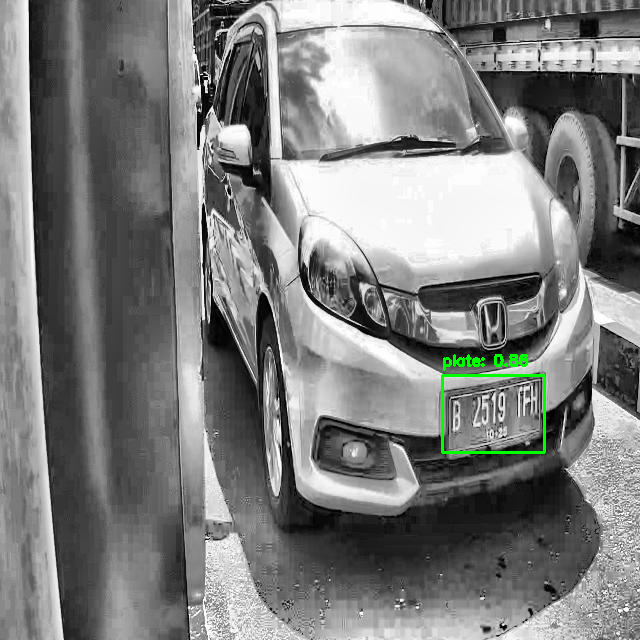

In [6]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
import glob

# Load your custom-trained model
model_path = 'runs/detect/train/weights/best.pt'
model = YOLO(model_path)

# Find a test image from your validation set
# Make sure the path is correct based on where your dataset was downloaded
image_path = glob.glob(f'{DATASET_LOCATION}/valid/images/*')[10]
image = cv2.imread(image_path)

# Run inference
results = model(image)[0]

# --- Draw bounding boxes on the image ---
for box in results.boxes:
    # Get coordinates of the bounding box
    x1, y1, x2, y2 = [int(i) for i in box.xyxy[0]]
    # Get the confidence score
    confidence = box.conf[0]
    # Get the class label
    class_id = int(box.cls[0])
    class_name = model.names[class_id]

    # Draw the rectangle
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Put the label and confidence score
    label = f"{class_name}: {confidence:.2f}"
    cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)


print("Displaying detection results:")
# Display the image with detections
cv2_imshow(image)

In [ ]:
from ultralytics import YOLO

# Load your custom-trained model
model_path = 'runs/detect/train/weights/best.pt'
model = YOLO(model_path)

# Export the model to TFLite format
# This will create a 'best.tflite' file in the same directory
model.export(format='tflite')

print("✅ Model successfully exported to 'best.tflite'")

Ultralytics 8.3.208 🚀 Python-3.12.11 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (6.0 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'ai-edge-litert>=1.2.0', 'onnx>=1.12.0', 'onnx2tf>=1.26.3', 'onnxslim>=0.1.67', 'onnxruntime-gpu'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 19.4s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


TensorFlow SavedModel: starting export with tensorflow 2.19.0...
Unzipping calibration_image_sample_data_20x128x128x3_float32.npy.zip to /content/calibration_image_sample_data_20x128x128x3_float32.np

In [ ]:
# Export the model to ONNX format for the web app
model.export(format='onnx')

Ultralytics 8.3.208 🚀 Python-3.12.11 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (6.0 MB)

ONNX: starting export with onnx 1.19.1 opset 22...
ONNX: slimming with onnxslim 0.1.71...
ONNX: export success ✅ 0.9s, saved as 'runs/detect/train/weights/best.onnx' (11.7 MB)

Export complete (1.1s)
Results saved to /content/runs/detect/train/weights
Predict:         yolo predict task=detect model=runs/detect/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=runs/detect/train/weights/best.onnx imgsz=640 data=/content/Indonesia-License-Plate-2/data.yaml  
Visualize:       https://netron.app


'runs/detect/train/weights/best.onnx'

Loading EasyOCR reader...
EasyOCR reader loaded.

0: 384x640 1 plate, 59.9ms
Speed: 8.5ms preprocess, 59.9ms inference, 225.6ms postprocess per image at shape (1, 3, 384, 640)

Displaying detection and OCR results:


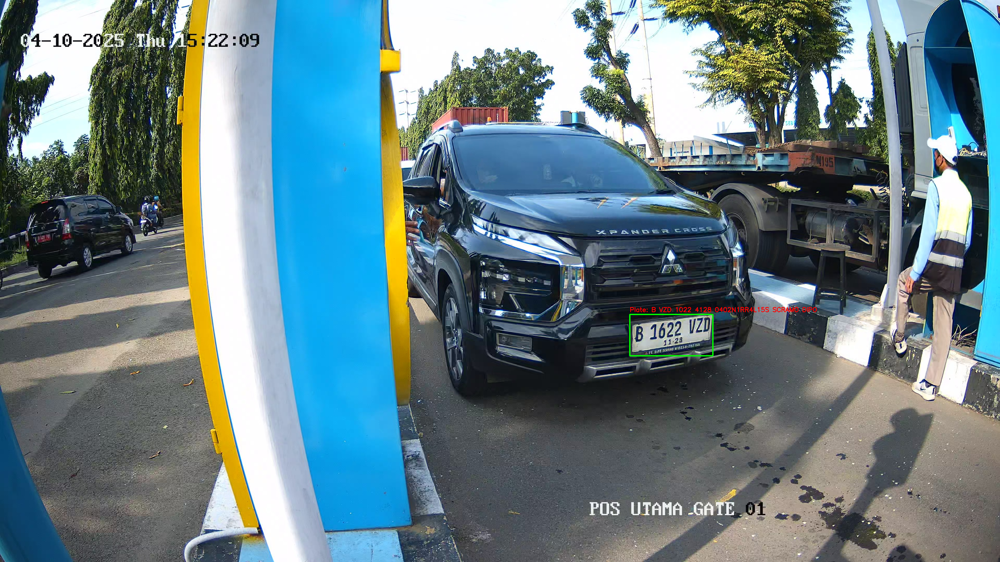

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
import glob
import easyocr

# --- 1. Load Models ---

# Load your custom-trained YOLOv8 model
# Make sure this path is correct in your Colab environment
model_path = '/content/best.pt'
model = YOLO(model_path)

# Load the EasyOCR reader for English
# This will download the model on the first run
print("Loading EasyOCR reader...")
reader = easyocr.Reader(['en'])
print("EasyOCR reader loaded.")

# --- 2. Perform Inference and OCR ---

# Path to your test image
# Make sure this file is uploaded to your Colab environment
image_path = "/content/example_image.jpg"
image = cv2.imread(image_path)
original_image = image.copy() # Keep a copy for final display

# Run YOLOv8 inference
results = model(image)[0]

# --- 3. Process Detections and Read Text ---
if results.boxes:
    for box in results.boxes:
        # Get bounding box coordinates
        x1, y1, x2, y2 = [int(i) for i in box.xyxy[0]]

        # --- CROP THE LICENSE PLATE ---
        plate_crop = original_image[y1:y2, x1:x2]

        # --- USE EASYOCR TO READ TEXT ---
        # Convert the cropped plate to grayscale for better OCR performance
        plate_gray = cv2.cvtColor(plate_crop, cv2.COLOR_BGR2GRAY)

        # Read the text from the grayscale image
        ocr_result = reader.readtext(plate_gray)

        plate_text = ""
        # The result is a list of (bbox, text, confidence)
        if ocr_result:
            # Concatenate results in case OCR splits the text
            plate_text = " ".join([res[1] for res in ocr_result]).upper()

        # --- 4. Display Results on the Image ---

        # Draw the bounding box on the original image
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 3)

        # Prepare the text to display (label + recognized plate text)
        label = f"Plate: {plate_text}"

        # Put the final text on the image
        cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)
else:
    print("No license plates were detected in the image.")


print("\nDisplaying detection and OCR results:")
# Display the final image
cv2_imshow(image)